# SST

## Imports

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as path_effects
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import plotly.graph_objects as go
import plotly.express as px
import dash
from dash import dcc, html, Input, Output, State
from utils import find_free_port

## Data

In [2]:
nemo00_sst_monthly_2011_2022 = xr.open_dataarray('../data/processed/nemo00_sst_monthly_2011_2022.nc')
observations_sst_monthly_2011_2022 = xr.open_dataarray('../data/processed/observations_sst_monthly_2011_2022.nc')

In [3]:
observations_sst_monthly_2011_2022

<xarray.DataArray 'sst' (time: 144, lat: 180, lon: 360)>
[9331200 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
  * time     (time) datetime64[ns] 2011-01-01 2011-02-01 ... 2022-12-01
Attributes: (12/13)
    long_name:             Monthly Mean of Sea Surface Temperature
    unpacked_valid_range:  [-5. 40.]
    actual_range:          [-1.7999996 35.56862  ]
    units:                 degC
    precision:             2
    var_desc:              Sea Surface Temperature
    ...                    ...
    level_desc:            Surface
    statistic:             Mean
    parent_stat:           Weekly Mean
    standard_name:         sea_surface_temperature
    cell_methods:          time: mean (monthly from weekly values interpolate...
    valid_range:           [-500 4000]

In [4]:
nemo00_sst_monthly_2011_2022

<xarray.DataArray (time: 144, lat: 180, lon: 360)>
[9331200 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2011-01-01 2011-02-01 ... 2022-12-01
  * lat      (lat) float64 89.5 88.5 87.5 86.5 85.5 ... -86.5 -87.5 -88.5 -89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Attributes:
    regrid_method:  bilinear
    long_name:      Monthly Mean of Sea Surface Temperature
    units:          degC
    standard_name:  sea_surface_temperature

## Montly Climatology

In [5]:
clim_obs = observations_sst_monthly_2011_2022.groupby('time.month').mean('time')
clim_model = nemo00_sst_monthly_2011_2022.groupby('time.month').mean('time')
clim_error = clim_model - clim_obs

### Global

#### Interactive

In [6]:
# Colors for selected points (repeat if needed)
COLOR_CYCLE = px.colors.qualitative.Plotly

app = dash.Dash(__name__)

initial_scale = {'min': -4, 'max': 4}
initial_month = 3

def create_map_figure(scale, month, selected_points, relayout_data=None):
    error_map = clim_error.sel(month=month)
    z = error_map.values
    x = clim_error['lon'].values
    y = clim_error['lat'].values

    fig = go.Figure(go.Heatmap(
        z=z,
        x=x,
        y=y,
        colorscale='RdBu_r',
        zmin=scale['min'],
        zmax=scale['max'],
        colorbar=dict(title='SST Error (°C)')
    ))

    # Add markers for selected points
    for i, pt in enumerate(selected_points):
        fig.add_trace(go.Scatter(
            x=[pt['lon']],
            y=[pt['lat']],
            mode='markers',
            marker=dict(color=pt['color'], size=12, line=dict(color='black', width=1)),
            name=f"Selected ({pt['lat']:.2f}, {pt['lon']:.2f})",
            hoverinfo='text',
            hovertext=f"Point {i+1}: ({pt['lat']:.2f}, {pt['lon']:.2f})"
        ))

    fig.update_layout(
        showlegend=False,
        title=f'Climatology Error - Month {month}',
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        dragmode='pan',
    
        # Make background white to mimic white continents
        plot_bgcolor='white',
        paper_bgcolor='white',
    
        # Add coastlines as grid lines for reference
        xaxis=dict(
            showgrid=True,
            gridcolor='lightgray',
            zeroline=False,
            showline=True,
            linecolor='black',
            mirror=True,
            range=[min(x), max(x)]
        ),
        yaxis=dict(
            showgrid=True,
            gridcolor='lightgray',
            zeroline=False,
            showline=True,
            linecolor='black',
            mirror=True,
            range=[min(y), max(y)]
        )
    )

    # Preserve zoom if relayout_data provided
    if relayout_data:
        x0 = relayout_data.get('xaxis.range[0]')
        x1 = relayout_data.get('xaxis.range[1]')
        y0 = relayout_data.get('yaxis.range[0]')
        y1 = relayout_data.get('yaxis.range[1]')

        if None not in (x0, x1, y0, y1):
            if y0 > y1:
                y0, y1 = y1, y0
            fig.update_layout(
                xaxis=dict(range=[x0, x1]),
                yaxis=dict(range=[y0, y1])
            )

    return fig

app.layout = html.Div([
    html.H2("Interactive SST Climatology Time Series Viewer"),

    html.Div([
        html.Label("Set Error Scale (°C): "),
        dcc.Input(id='scale-min', type='number', value=initial_scale['min'], step=0.1),
        dcc.Input(id='scale-max', type='number', value=initial_scale['max'], step=0.1),
        html.Button("Update Scale", id='update-scale-btn', n_clicks=0),
    ], style={'marginBottom': '20px'}),

    html.Div([
        html.Label("Select Month:"),
        dcc.Slider(
            id='month-slider',
            min=1,
            max=12,
            step=1,
            value=initial_month,
            marks={i: str(i) for i in range(1, 13)},
        )
    ], style={'width': '40%', 'marginBottom': '20px'}),

    dcc.Store(id='current-scale', data=initial_scale),
    dcc.Store(id='selected-points-store', data=[]),

    html.Div([
        dcc.Graph(id='ts-plot', style={'width': '48%', 'display': 'inline-block', 'verticalAlign': 'top'}),

        html.Div([
            dcc.Graph(id='map-plot', style={'height': '500px'}),
            html.Button('Reset All Points', id='reset-all-btn', n_clicks=0, style={'marginTop': '10px'}),
            html.Div(id='legend-container', style={
                'padding': '10px',
                'border': '1px solid lightgray',
                'marginTop': '10px',
                'backgroundColor': '#f9f9f9',
                'fontFamily': 'monospace',
                'fontSize': '13px',
                'maxHeight': '200px',
                'overflowY': 'auto'
            }),
        ], style={'width': '48%', 'display': 'inline-block', 'verticalAlign': 'top'}),
    ])
])

# Update scale store
@app.callback(
    Output('current-scale', 'data'),
    Input('update-scale-btn', 'n_clicks'),
    State('scale-min', 'value'),
    State('scale-max', 'value')
)
def update_scale(n_clicks, vmin, vmax):
    if vmin is not None and vmax is not None and vmin < vmax:
        return {'min': vmin, 'max': vmax}
    return dash.no_update

# Update map figure when scale, month, selected points or zoom changes
@app.callback(
    Output('map-plot', 'figure'),
    Input('current-scale', 'data'),
    Input('month-slider', 'value'),
    Input('selected-points-store', 'data'),
    Input('map-plot', 'relayoutData'),
)
def update_map(scale, month, selected_points, relayout_data):
    return create_map_figure(scale, month, selected_points, relayout_data)

@app.callback(
    Output('selected-points-store', 'data'),
    Input('map-plot', 'clickData'),
    Input({'type': 'remove-point-btn', 'index': dash.ALL}, 'n_clicks'),
    Input('reset-all-btn', 'n_clicks'),
    State('selected-points-store', 'data'),
    prevent_initial_call=True
)
def update_selected_points(clickData, remove_clicks, reset_clicks, selected_points):
    ctx = dash.callback_context
    if not ctx.triggered:
        raise dash.exceptions.PreventUpdate
    
    trigger_id = ctx.triggered[0]['prop_id'].split('.')[0]

    if selected_points is None:
        selected_points = []

    # Reset all points
    if trigger_id == 'reset-all-btn' and reset_clicks:
        return []

    # Remove one point
    if trigger_id.startswith('{'):
        import json
        triggered_obj = json.loads(trigger_id)
        idx_to_remove = triggered_obj['index']
        if 0 <= idx_to_remove < len(selected_points):
            selected_points.pop(idx_to_remove)
        return selected_points

    # Add point on map click
    if trigger_id == 'map-plot' and clickData:
        lon = clickData['points'][0]['x']
        lat = clickData['points'][0]['y']

        # Avoid duplicates (nearest match tolerance)
        tol = 0.1
        for pt in selected_points:
            if abs(pt['lat'] - lat) < tol and abs(pt['lon'] - lon) < tol:
                return selected_points  # already selected

        # Assign color cycling through the list
        color = COLOR_CYCLE[len(selected_points) % len(COLOR_CYCLE)]
        selected_points.append({'lat': lat, 'lon': lon, 'color': color})
        return selected_points

    return dash.no_update

# Update legend container
@app.callback(
    Output('legend-container', 'children'),
    Input('selected-points-store', 'data')
)
def update_legend(selected_points):
    if not selected_points:
        return "No points selected."

    legend_items = []
    for i, pt in enumerate(selected_points):
        legend_items.append(
            html.Div([
                html.Span("⬤ ", style={'color': pt['color'], 'fontSize': '16px'}),
                f"({pt['lat']:.2f}, {pt['lon']:.2f})",
                html.Button('×', id={'type': 'remove-point-btn', 'index': i}, n_clicks=0,
                            style={
                                'marginLeft': '8px',
                                'color': 'red',
                                'background': 'none',
                                'border': 'none',
                                'cursor': 'pointer',
                                'fontWeight': 'bold',
                                'fontSize': '16px',
                                'lineHeight': '16px',
                                'padding': '0',
                            })
            ], style={'display': 'flex', 'alignItems': 'center', 'marginBottom': '6px'})
        )
    return legend_items

# Update time series plot with **all selected points** on one figure
@app.callback(
    Output('ts-plot', 'figure'),
    Input('selected-points-store', 'data'),
    Input('current-scale', 'data')
)
def update_timeseries(selected_points, scale):
    fig = go.Figure()
    if not selected_points:
        fig.update_layout(
            title='Select points on the map to see their time series',
            xaxis_title='Month',
            yaxis_title='SST Error (°C)',
            yaxis=dict(range=[scale['min'], scale['max']])
        )
        return fig

    for pt in selected_points:
        ts = clim_error.sel(lat=pt['lat'], lon=pt['lon'], method='nearest')
        fig.add_trace(go.Scatter(
            x=ts['month'].values,
            y=ts.values,
            mode='lines+markers',
            name=f"({pt['lat']:.2f}, {pt['lon']:.2f})",
            line=dict(color=pt['color']),
            marker=dict(color=pt['color'])
        ))

    fig.update_layout(
        title='SST Error Time Series for Selected Points',
        xaxis_title='Month',
        yaxis_title='SST Error (°C)',
        xaxis=dict(tickmode='linear', tick0=1, dtick=1),
        yaxis=dict(range=[scale['min'], scale['max']]),
        template='plotly_white'
    )
    return fig

if __name__ == '__main__':
    port = find_free_port()
    app.run(debug=True, port=port)

#### Non-interactive

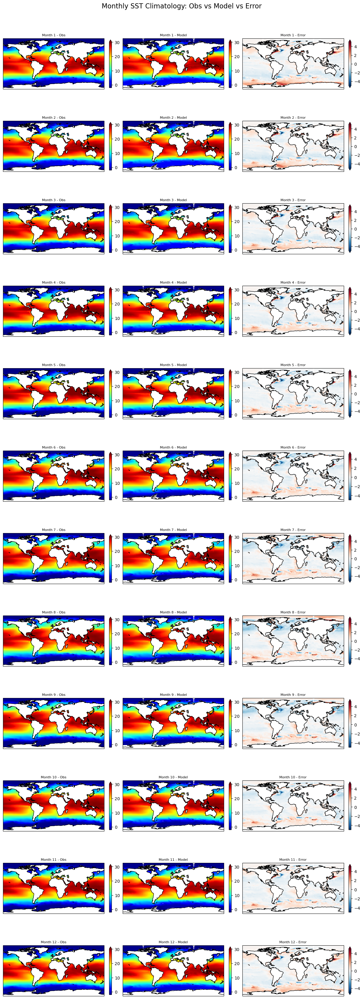

In [7]:
fig, axes = plt.subplots(
    12, 3, figsize=(12, 33), 
    subplot_kw={'projection': ccrs.PlateCarree()},
    constrained_layout=True
)

plot_info = [
    (clim_obs, 'Obs', 'jet', -2, 30),
    (clim_model, 'Model', 'jet', -2, 30),
    (clim_error, 'Error', 'RdBu_r', -5, 5),
]

for i, month in enumerate(range(1, 13)):
    for j, (data, label, cmap, vmin, vmax) in enumerate(plot_info):
        ax = axes[i, j]
        pcm = data.sel(month=month).plot(
            ax=ax, cmap=cmap, vmin=vmin, vmax=vmax,
            transform=ccrs.PlateCarree(),
            add_colorbar=True, add_labels=False,
            cbar_kwargs={'shrink': 0.6}
        )
        ax.coastlines()
        ax.set_title(f'Month {month} - {label}', fontsize=8)

# Optional: add a shared colorbar manually
# (adjust as needed based on layout)

plt.suptitle("Monthly SST Climatology: Obs vs Model vs Error", fontsize=16, y=1.02)
plt.show()

#### Time series

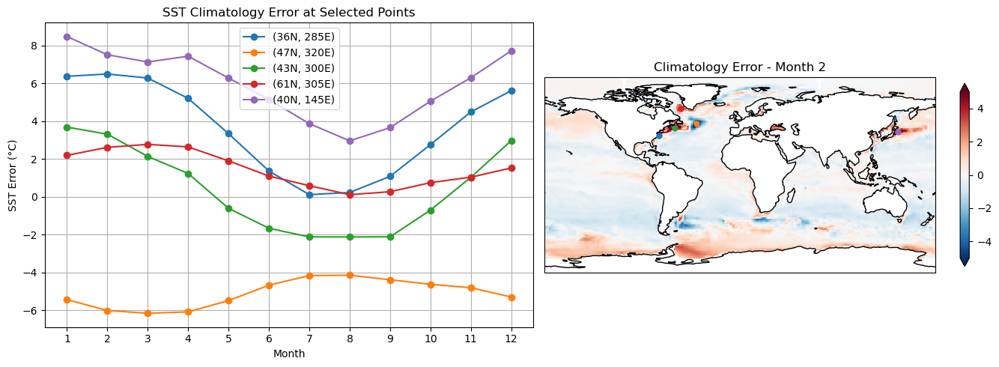

In [8]:
points = [(36, 285), (47, 320), (43, 300), (61, 305), (40, 145)]
labels = [f'({lat}N, {lon}E)' for lat, lon in points]

# Create separate axes: one normal, one Cartopy
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)  # time series
ax_map = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())  # map with coastlines

# Time series plot and collect colors
line_colors = []
for (lat, lon), lbl in zip(points, labels):
    ts = clim_error.sel(lat=lat, lon=lon, method='nearest')
    line, = ax_ts.plot(ts['month'], ts, 'o-', label=lbl)
    line_colors.append(line.get_color())

ax_ts.set(xlabel='Month', ylabel='SST Error (°C)',
          title='SST Climatology Error at Selected Points',
          xticks=range(1, 13))
ax_ts.legend()
ax_ts.grid(True)

# Map plot
month = 2
clim_error.sel(month=month).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-5, vmax=5,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 0.6}
)

# Overlay the points
for (lat, lon), c in zip(points, line_colors):
    ax_map.plot(lon, lat, 'o', color=c, ms=5, transform=ccrs.PlateCarree())

ax_map.coastlines()
ax_map.set_title(f'Climatology Error - Month {month}')

plt.tight_layout()
plt.show()

### Tropics

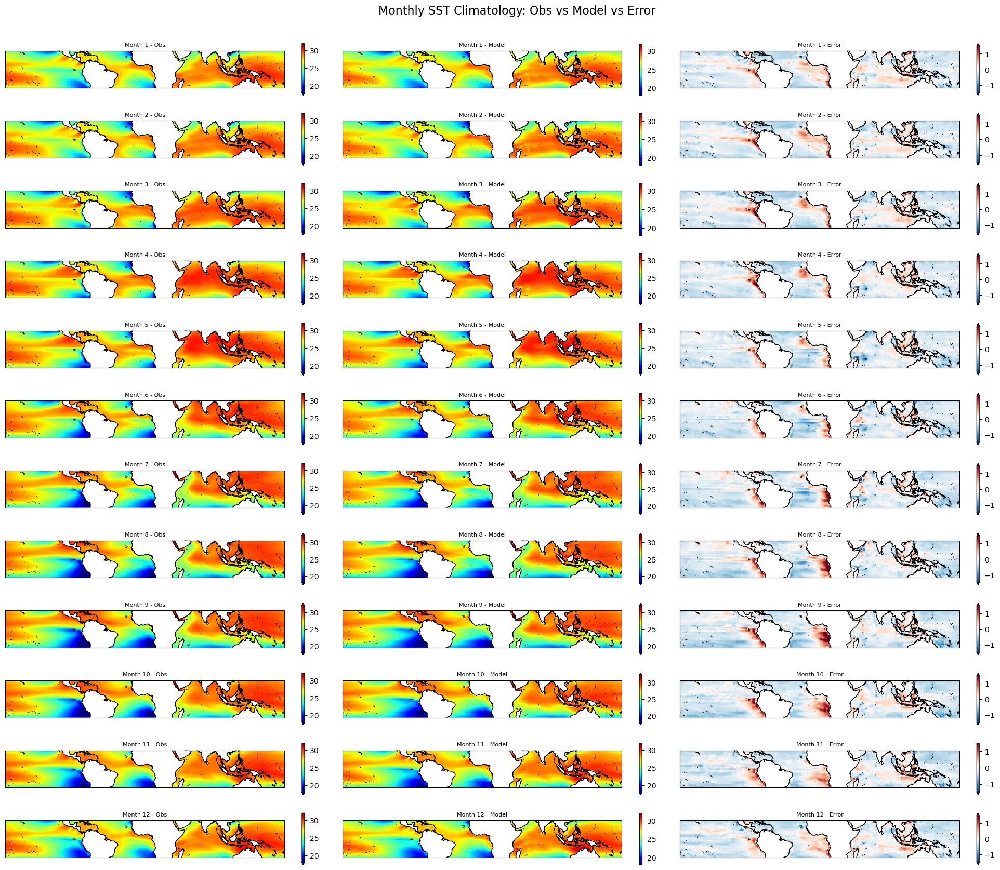

In [9]:
fig = plt.figure(figsize=(20, 18))
gs = gridspec.GridSpec(12, 3, figure=fig)  # 12 rows (months), 3 columns (Obs, Model, Error)

plot_info = [
    (clim_obs, 'Obs', 'jet', 18, 32),
    (clim_model, 'Model', 'jet', 18, 32),
    (clim_error, 'Error', 'RdBu_r', -1.5, 1.5),
]

for i, month in enumerate(range(1, 13)):
    for j, (data, label, cmap, vmin, vmax) in enumerate(plot_info):
        ax = fig.add_subplot(gs[i, j], projection=ccrs.PlateCarree())
        data_slice = data.sel(month=month, lat=slice(23.5, -23.5))
        data_slice.plot(
            ax=ax,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            transform=ccrs.PlateCarree(),
            add_colorbar=True,
            add_labels=False,
            cbar_kwargs={'shrink': 0.7}
        )
        ax.coastlines()
        ax.set_title(f'Month {month} - {label}', fontsize=8)

fig.suptitle("Monthly SST Climatology: Obs vs Model vs Error", fontsize=16, y=0.94)
plt.tight_layout(rect=[0, 0, 1, 0.94])  
plt.show()

#### Time series

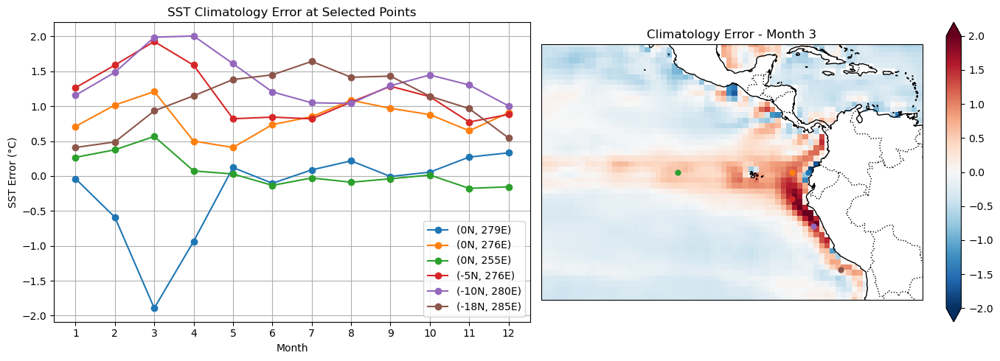

In [10]:
points = [(0, 279), (0, 276), (0, 255), (-5, 276), (-10, 280), (-18, 285)]
labels = [f'({lat}N, {lon}E)' for lat, lon in points]

# Create one matplotlib and one cartopy axis
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)
ax_map = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())

# Time series plot
line_colors = []
for (lat, lon), lbl in zip(points, labels):
    ts = clim_error.sel(lat=lat, lon=lon, method='nearest')
    line, = ax_ts.plot(ts['month'], ts, 'o-', label=lbl)
    line_colors.append(line.get_color())

ax_ts.set(xlabel='Month', ylabel='SST Error (°C)',
          title='SST Climatology Error at Selected Points',
          xticks=range(1, 13))
ax_ts.legend()
ax_ts.grid(True)

# Map plot
month = 3
clim_error.sel(month=month, lat=slice(23.5, -23.5)).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-2, vmax=2,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 1.0}
)

# Plot selected points
for (lat, lon), c in zip(points, line_colors):
    ax_map.plot(lon, lat, 'o', color=c, ms=5, transform=ccrs.PlateCarree())

ax_map.coastlines()
ax_map.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black')
ax_map.set_title(f'Climatology Error - Month {month}')
ax_map.set_extent([230, 300, 23.5, -23.5], crs=ccrs.PlateCarree())  

plt.tight_layout()
plt.show()

### Poles

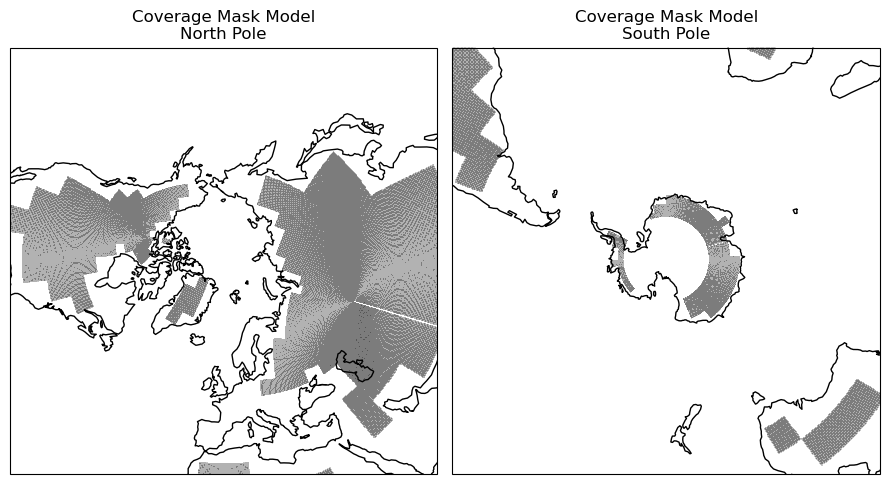

In [11]:
model_original = xr.open_dataset('../data/model/nemo00_1m_201001_202212_grid_T.nc')
coverage_mask = model_original.tos.isel(time_counter=0).notnull()
non_coverage_mask = ~coverage_mask
mesh = xr.open_dataset('../data/model/orca05l75_domain_cfg_nemov5_10m.nc')
lonf = mesh['glamf'].values
latf = mesh['gphif'].values

# Plot the coverage mask alone first
fig = plt.figure(figsize=(9, 9))
crspc = ccrs.PlateCarree() 

# North Pole mask
ax_north = plt.subplot(1, 2, 1, projection=ccrs.NorthPolarStereo())
ax_north.set_extent([-180, 180, 30, 90], crspc)
ax_north.pcolormesh(
    lonf, latf, non_coverage_mask[1:, 1:],
    transform=crspc,
    cmap='Greys', alpha=0.3,
    shading='auto'
)
ax_north.coastlines()
ax_north.set_title('Coverage Mask Model\nNorth Pole')

# South Pole mask
ax_south = plt.subplot(1, 2, 2, projection=ccrs.SouthPolarStereo())
ax_south.set_extent([-180, 180, -90, -30], crspc)
ax_south.pcolormesh(
    lonf, latf, non_coverage_mask[1:, 1:],
    transform=crspc,
    cmap='Greys', alpha=0.3,
    shading='auto'
)
ax_south.coastlines()
ax_south.set_title('Coverage Mask Model\nSouth Pole')

plt.tight_layout()
plt.show()

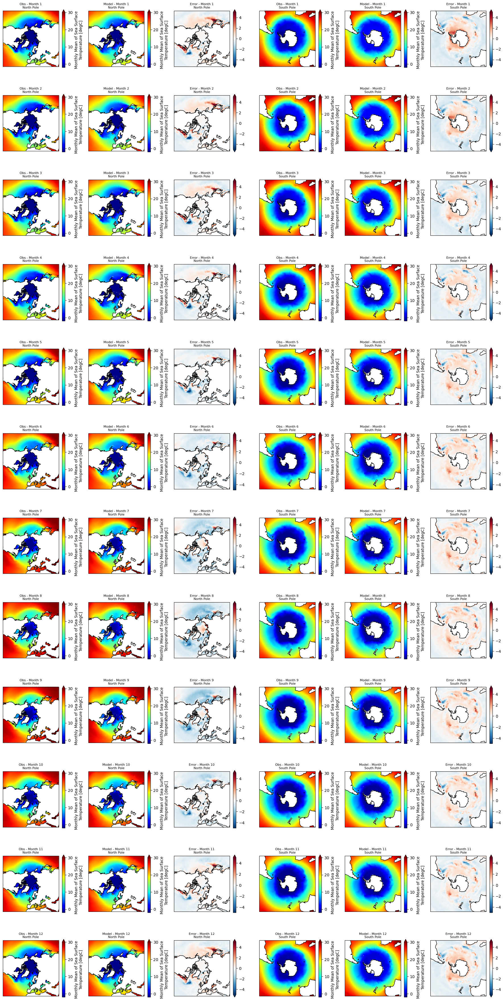

In [12]:
crspc = ccrs.PlateCarree()
months = range(12)  
datasets = [clim_obs, clim_model, clim_error]
titles = ['Obs', 'Model', 'Error']
vmins = [-2, -2, -5]
vmaxs = [30, 30, 5]
cmaps = ['jet', 'jet', 'RdBu_r']

fig = plt.figure(figsize=(18, 36))

for row, month in enumerate(months):
    for col, (data, title, vmin, vmax, cmap) in enumerate(zip(datasets, titles, vmins, vmaxs, cmaps)):
        # North Pole
        ax_north = plt.subplot(12, 6, row * 6 + col + 1, projection=ccrs.NorthPolarStereo())
        ax_north.set_extent([-180, 180, 30, 90], crspc)
        data.isel(month=month).plot(
            ax=ax_north, transform=crspc, vmin=vmin, vmax=vmax, cmap=cmap,
            add_colorbar=True, add_labels=True,
            cbar_kwargs={'shrink': 0.7}
        )
        ax_north.coastlines()
        ax_north.set_title(f'{title} - Month {month + 1}\nNorth Pole', fontsize=8)

        # South Pole
        ax_south = plt.subplot(12, 6, row * 6 + col + 4, projection=ccrs.SouthPolarStereo())
        ax_south.set_extent([-180, 180, -90, -30], crspc)
        data.isel(month=month).plot(
            ax=ax_south, transform=crspc, vmin=vmin, vmax=vmax, cmap=cmap,
            add_colorbar=True, add_labels=True,
            cbar_kwargs={'shrink': 0.7}
        )
        ax_south.coastlines()
        ax_south.set_title(f'{title} - Month {month + 1}\nSouth Pole', fontsize=8)

plt.tight_layout()
plt.show()

#### Mean Time series

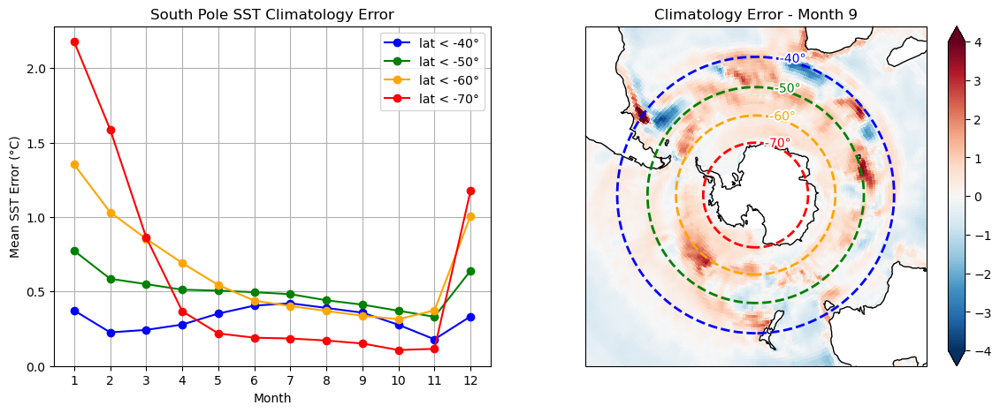

In [13]:
LAT_values = [-40, -50, -60, -70]
color_names = ['blue', 'green', 'orange', 'red']  # Standard, clear colors
lons = np.linspace(-180, 180, 360)

# Create figure and axes
fig = plt.figure(figsize=(14, 5))
ax_ts = plt.subplot(1, 2, 1)
ax_map = plt.subplot(1, 2, 2, projection=ccrs.SouthPolarStereo())

# Plot time series
for LAT, color in zip(LAT_values, color_names):
    mask = clim_error.lat < LAT
    south_mean = clim_error.where(mask).mean(dim=["lat", "lon"])
    ax_ts.plot(south_mean['month'], south_mean, 'o-', label=f'lat < {LAT}°', color=color)

ax_ts.set(xlabel='Month', ylabel='Mean SST Error (°C)',
          title='South Pole SST Climatology Error',
          xticks=range(1, 13))
ax_ts.set_ylim(bottom=0)
ax_ts.grid(True)
ax_ts.legend()

# Map: plot error field for one month
month = 9
clim_error.sel(month=month).plot(
    ax=ax_map, transform=ccrs.PlateCarree(),
    cmap='RdBu_r', vmin=-4, vmax=4,
    add_colorbar=True, add_labels=False,
    cbar_kwargs={'shrink': 1.0}
)
ax_map.coastlines()
ax_map.set_extent([-180, 180, -90, -30], crs=ccrs.PlateCarree())
ax_map.set_title(f'Climatology Error - Month {month}')

# Add latitude circles and annotate
label_lon = 10  # Longitude at which to place labels (in degrees)

for LAT, color in zip(LAT_values, color_names):
    lat_line = np.full_like(lons, LAT)
    ax_map.plot(lons, lat_line, transform=ccrs.PlateCarree(),
                color=color, linewidth=2, linestyle='--')

    # Add text annotation at (label_lon, LAT)
    ax_map.text(label_lon, LAT, f"{LAT}°", color=color,
                transform=ccrs.PlateCarree(),
                fontsize=10, ha='left', va='center',
                path_effects=[path_effects.withStroke(linewidth=3, foreground='white')])